In [1]:
import time
import numpy as np
import matplotlib.pyplot as plt

import sys
sys.path.insert(0, './')

def generateModelV2(working_directory, 
                    number_directory=0, 
                    number_images=0,
                    #number_cluster=10,
                    descriptor_generator="SIFT", 
                    number_feature=200,
                    minimum_size_descriptor=20, 
                    #mode_affichage=""
                   ):
    start_time_model = time.time()

    # class de travail
    from Python.automaticImageIndexing import AutomaticImageIndexing
    automaticImageIndexing = AutomaticImageIndexing()

    print(''.join(['Version : ', automaticImageIndexing.version()]))
    print(''.join(['Data directory : ', automaticImageIndexing.data_directory]))

    automaticImageIndexing.n_limite_directories = number_directory
    automaticImageIndexing.n_limite_images = number_images
    print(''.join(['Max Number of directory : ', str(automaticImageIndexing.n_limite_directories)]))
    print(''.join(['Max Number of picture by directory : ', str(automaticImageIndexing.n_limite_images)]))

    automaticImageIndexing.working_directory = working_directory#'C:/Users/naru_/OneDrive/Documents/openclassroom/P7 traitement image/'
    automaticImageIndexing.annotation_directory = 'annotation/'
    automaticImageIndexing.picture_directory = 'images/'
    
    automaticImageIndexing.feature_generator = descriptor_generator
    print('Generator : %s' % automaticImageIndexing.feature_generator)
    automaticImageIndexing.n_feature = number_feature 
    print('Number of feature : %d' % automaticImageIndexing.n_feature)
    automaticImageIndexing.feature_size_min = minimum_size_descriptor
    print('Minimum feature size  %d' % automaticImageIndexing.feature_size_min)
    
    automaticImageIndexing.read_picture_and_feature_generation(with_sub_picture=True, descriptor_generator=descriptor_generator)
    print("Temps d execution apres parcour image + génération de features : %s secondes ---" % (time.time() - start_time_model))

    return automaticImageIndexing

def generateCluster(automaticImageIndexing, number_cluster=None, mode_affichage="", number_cluster_to_show=None):
    start_time_cluster = time.time()
    print("Generation des clusters pour %s descripteurs" % len(automaticImageIndexing.desc_list))
    if(number_cluster is None):
        number_cluster = int(10)
    automaticImageIndexing.n_clusters = number_cluster
    
    automaticImageIndexing.clusturing(automaticImageIndexing.n_clusters)
    print("Temps d execution apres Clustering : %s secondes ---" % (time.time() - start_time_cluster))
    mega_histo = automaticImageIndexing.developBagOfVisualWord()
    print("Temps d execution apres BOV : %s secondes ---" % (time.time() - start_time_cluster))
    automaticImageIndexing.plotHist(mega_histo, automaticImageIndexing.n_clusters, None)
    print("Temps d execution après plot BOV : %s secondes ---" % (time.time() - start_time_cluster))

    if number_cluster_to_show is None :
        number_cluster_to_show = int(number_cluster/2)
        
    if (mode_affichage == "subplot" or mode_affichage == "all"):
        print("affichage subplot des images liées au cluster %d" % number_cluster_to_show)
        automaticImageIndexing.plot_descriptor_in_cluster_subplot_V2(number_cluster_to_show)
        print("Temps d execution apres subplot : %s secondes ---" % (time.time() - start_time_cluster))
    
    if (mode_affichage == "individual_plot" or mode_affichage == "all"):
        print("affichage individuel des images liées au cluster %d" % number_cluster_to_show)
        automaticImageIndexing.plot_descriptor_in_cluster_individualplot(number_cluster_to_show)        
        print("Temps d execution apres individual_plot : %s secondes ---" % (time.time() - start_time_cluster))
    print("Temps d execution cluster : %s secondes ---" % (time.time() - start_time_cluster))

def showClusterPicture(automaticImageIndexing, mode_affichage="", number_cluster_to_show=None):
    start_time_showing = time.time()

    if automaticImageIndexing.n_clusters is None:
        print("Veuillez entrainer le model (& generer les cluster) ---")
    else:
        if number_cluster_to_show is None :
            number_cluster_to_show = int(automaticImageIndexing.n_clusters/2)

        if (mode_affichage == "subplot" or mode_affichage == "all"):
            print("affichage subplot des images liées au cluster %d" % number_cluster_to_show)
            automaticImageIndexing.plot_descriptor_in_cluster_subplot_V2(number_cluster_to_show)
            print("Temps d execution apres subplot : %s secondes ---" % (time.time() - start_time_showing))

        if (mode_affichage == "individual_plot" or mode_affichage == "all"):
            print("affichage individuel des images liées au cluster %d" % number_cluster_to_show)
            automaticImageIndexing.plot_descriptor_in_cluster_individualplot(number_cluster_to_show)        
            print("Temps d execution apres individual_plot : %s secondes ---" % (time.time() - start_time_showing))
    

Version : 0.3
Data directory : Data/
Max Number of directory : 10
Max Number of picture by directory : 100
Generator : ORB
Number of feature : 75
Minimum feature size  100
Computing Features for  n02085620-Chihuahua
Computing Features for  n02085782-Japanese_spaniel
Computing Features for  n02085936-Maltese_dog
Computing Features for  n02086079-Pekinese
Computing Features for  n02086240-Shih-Tzu
Computing Features for  n02086646-Blenheim_spaniel
Computing Features for  n02086910-papillon
Computing Features for  n02087046-toy_terrier
Computing Features for  n02087394-Rhodesian_ridgeback
Computing Features for  n02088094-Afghan_hound
Temps d execution apres parcour image + génération de features : 13.8259999752 secondes ---
-----------------------------------------------------------------------------------------
--------------------------------- start test cluster 500 ---------------------------------
Generation des clusters pour 70282 descripteurs
Temps d execution apres Clustering : 90

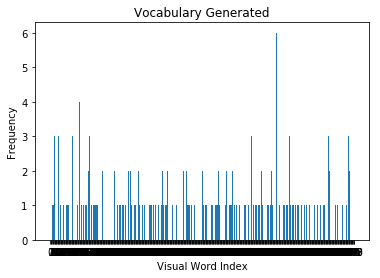

Temps d execution après plot BOV : 909.042000055 secondes ---
Temps d execution cluster : 909.042999983 secondes ---
affichage subplot des images liées au cluster 250
-------
204
80
-------


C:\Users\naru_\Anaconda3\envs\opencv2\lib\site-packages\matplotlib\axes\_base.py:3152: UserWarning: Attempting to set identical left==right results
in singular transformations; automatically expanding.
left=-0.5, right=-0.5
  'left=%s, right=%s') % (left, right))
C:\Users\naru_\Anaconda3\envs\opencv2\lib\site-packages\matplotlib\axes\_base.py:3471: UserWarning: Attempting to set identical bottom==top results
in singular transformations; automatically expanding.
bottom=-0.5, top=-0.5
  'bottom=%s, top=%s') % (bottom, top))


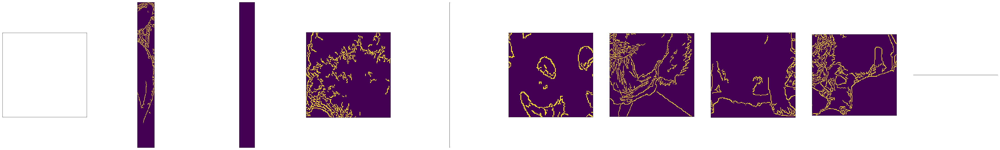

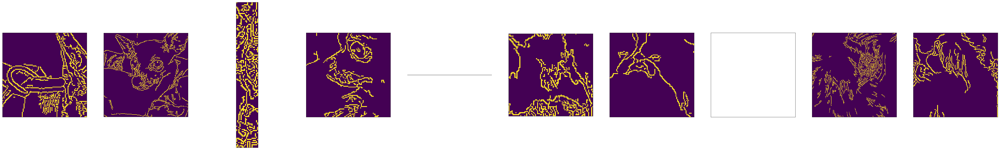

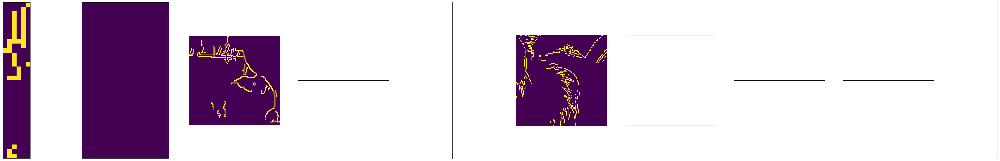

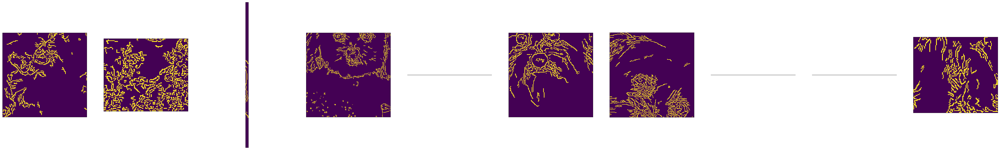

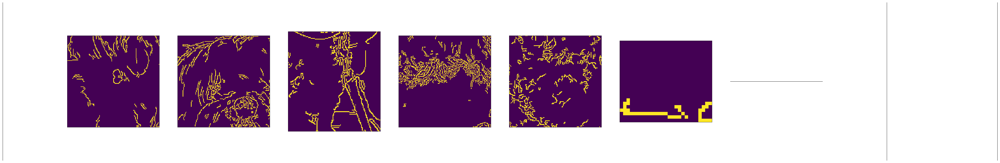

...

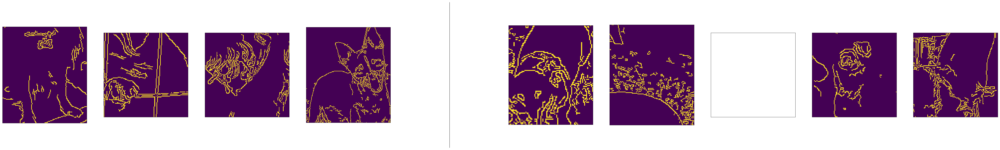

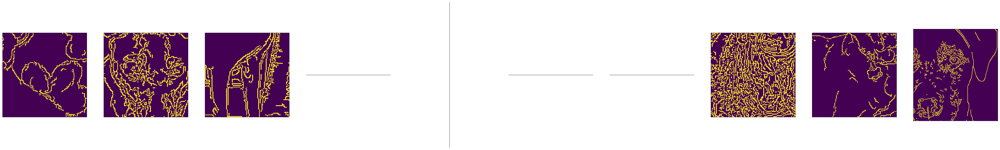

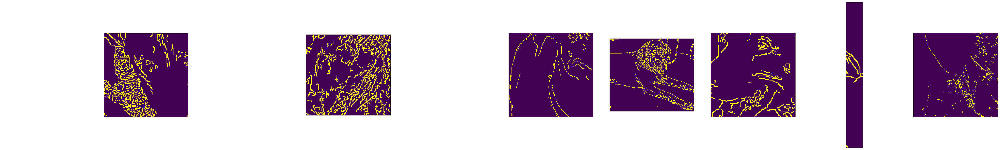

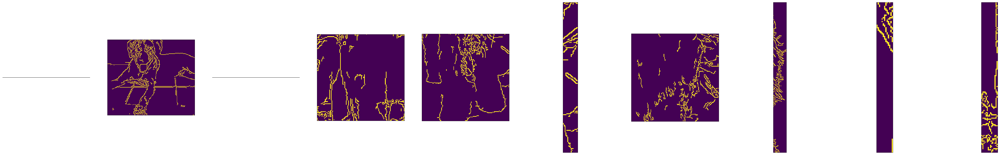

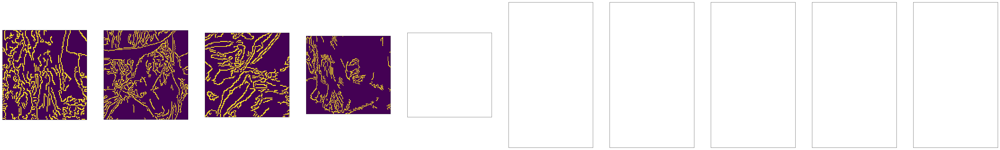

Temps d execution apres subplot : 18.9720001221 secondes ---
--------------------------------- start test cluster 500 ---------------------------------
-----------------------------------------------------------------------------------------
--------------------------------- start test cluster 400 ---------------------------------
Generation des clusters pour 70282 descripteurs
Temps d execution apres Clustering : 737.205000162 secondes ---
Vocabulary Histogram Generated
Temps d execution apres BOV : 737.205000162 secondes ---
Plotting histogram


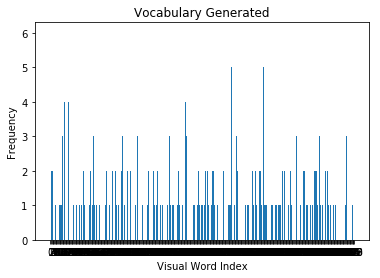

Temps d execution après plot BOV : 739.863000154 secondes ---
Temps d execution cluster : 739.863000154 secondes ---
affichage subplot des images liées au cluster 200
-------
216
80
-------


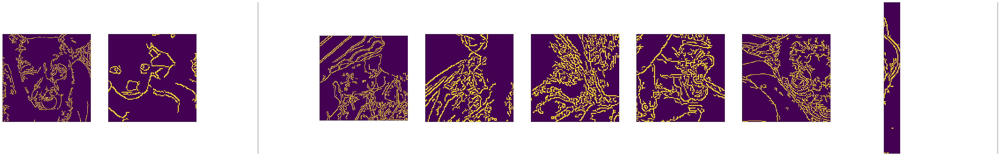

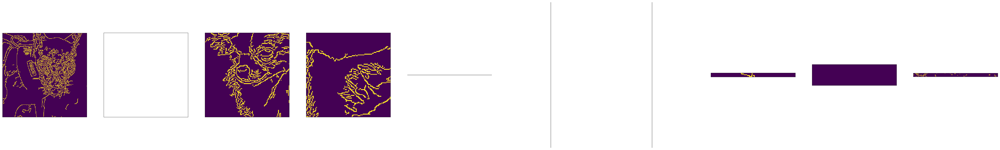

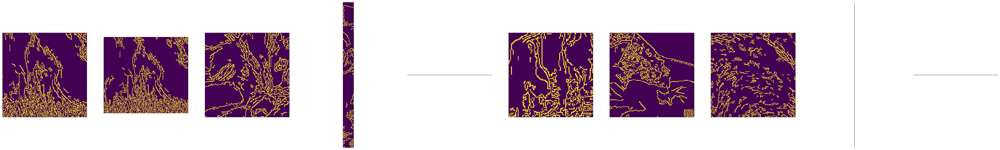

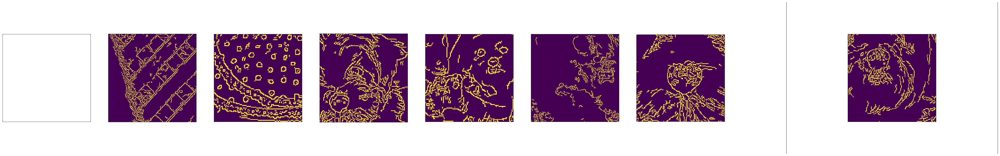

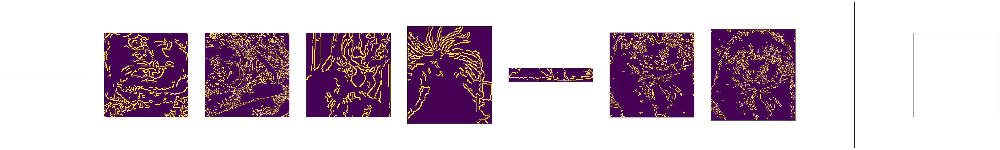

...

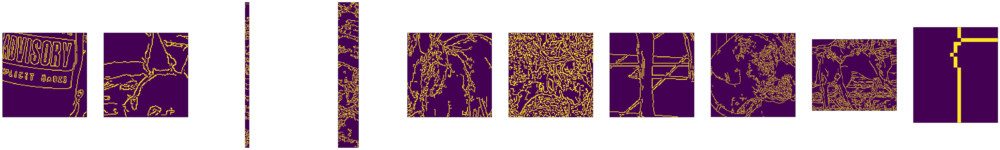

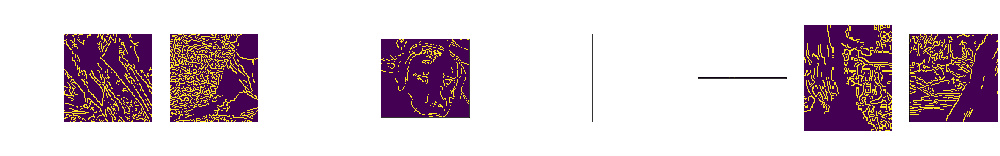

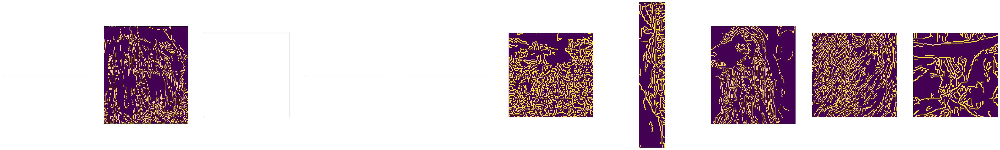

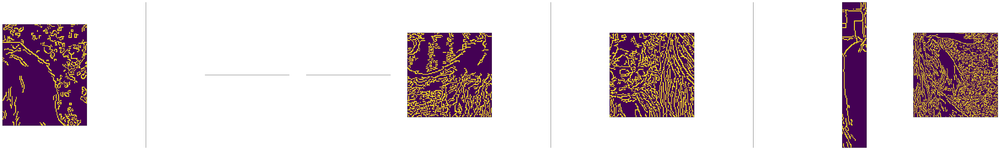

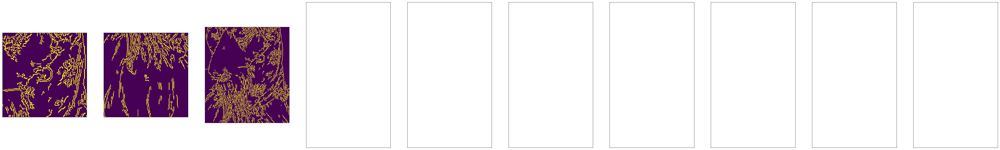

Temps d execution apres subplot : 15.0959999561 secondes ---
--------------------------------- start test cluster 400 ---------------------------------
-----------------------------------------------------------------------------------------
--------------------------------- start test cluster 300 ---------------------------------
Generation des clusters pour 70282 descripteurs
Temps d execution apres Clustering : 587.838000059 secondes ---
Vocabulary Histogram Generated
Temps d execution apres BOV : 587.838000059 secondes ---
Plotting histogram


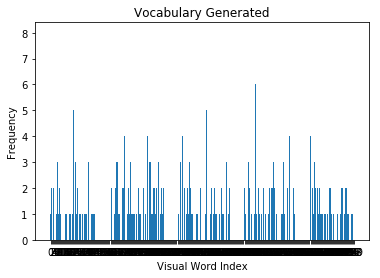

Temps d execution après plot BOV : 589.924999952 secondes ---
Temps d execution cluster : 589.924999952 secondes ---
affichage subplot des images liées au cluster 150
-------
252
80
-------


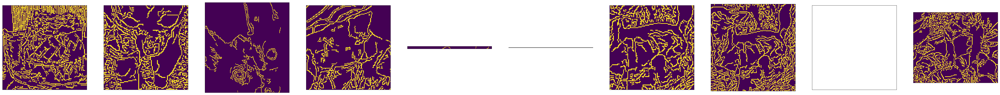

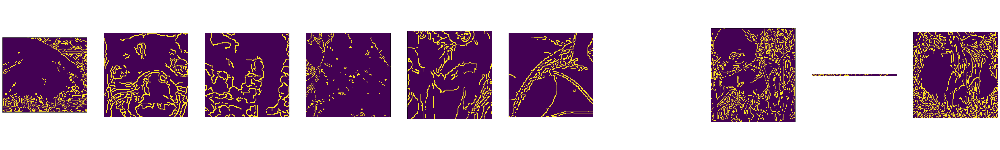

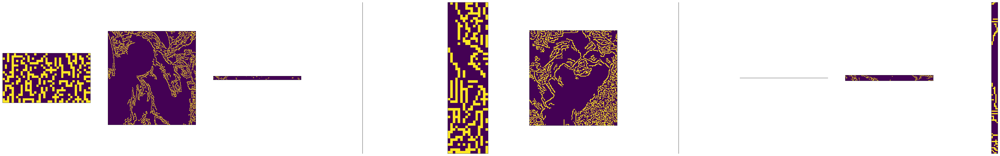

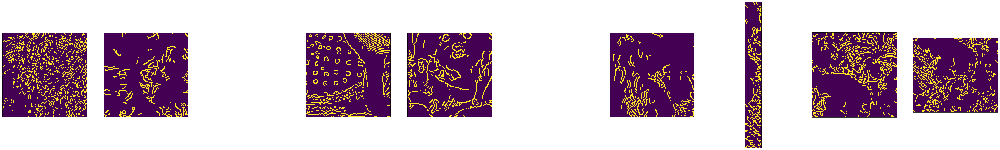

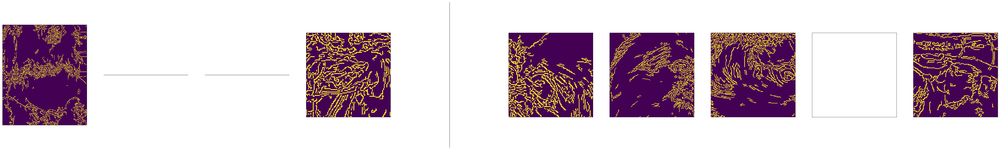

...

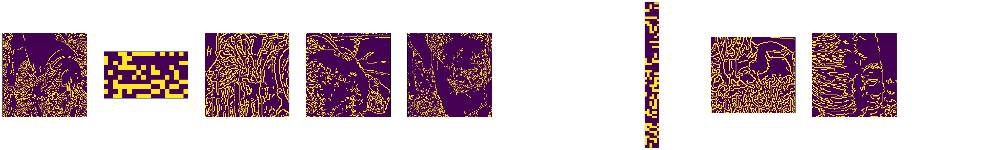

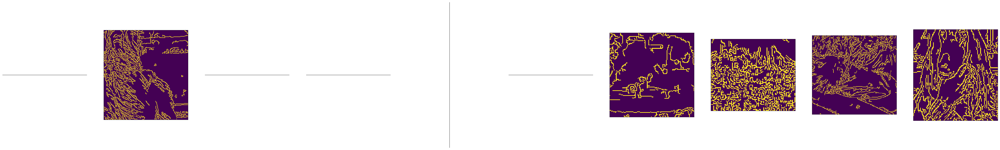

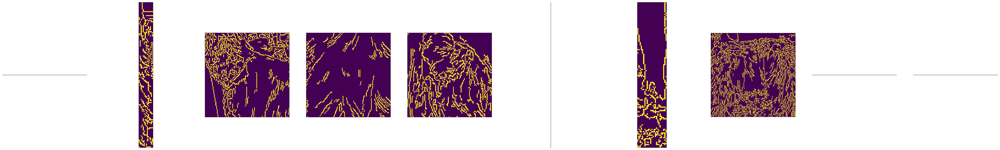

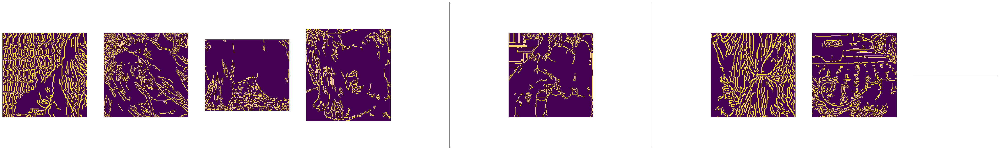

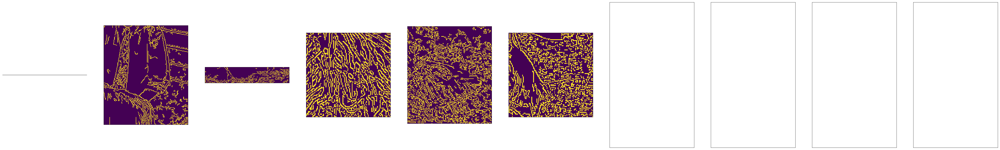

Temps d execution apres subplot : 17.986000061 secondes ---
--------------------------------- start test cluster 300 ---------------------------------
-----------------------------------------------------------------------------------------
--------------------------------- start test cluster 200 ---------------------------------
Generation des clusters pour 70282 descripteurs
Temps d execution apres Clustering : 441.779000044 secondes ---
Vocabulary Histogram Generated
Temps d execution apres BOV : 441.779000044 secondes ---
Plotting histogram


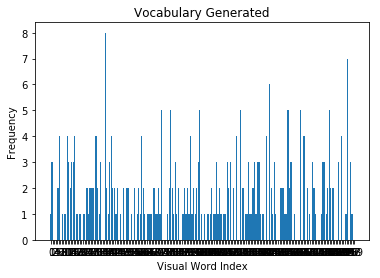

Temps d execution après plot BOV : 443.138000011 secondes ---
Temps d execution cluster : 443.138000011 secondes ---
affichage subplot des images liées au cluster 100
-------
408
80
-------


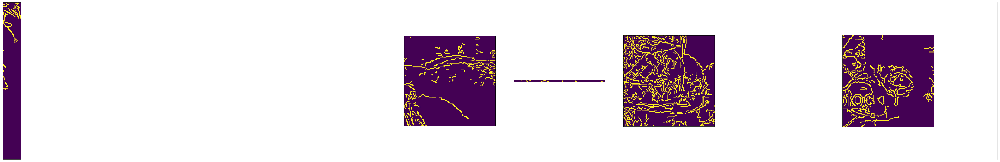

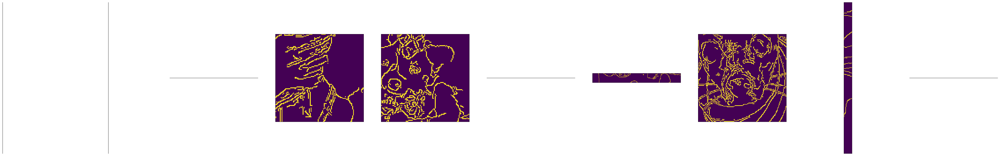

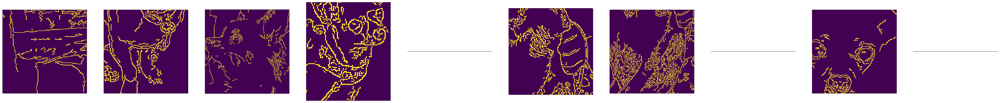

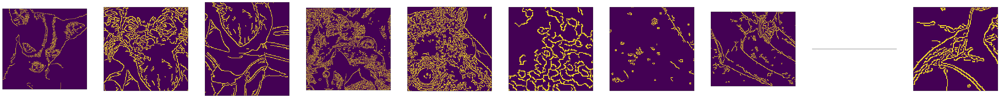

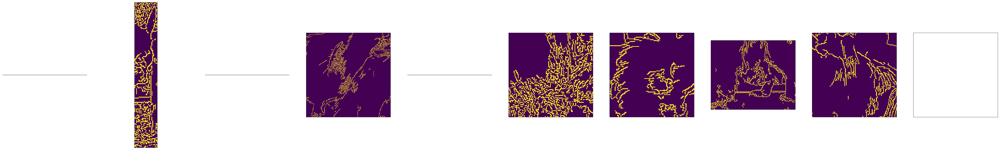

...

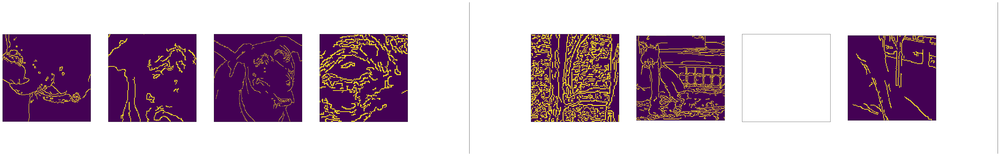

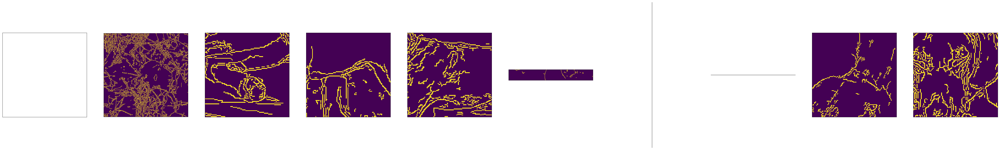

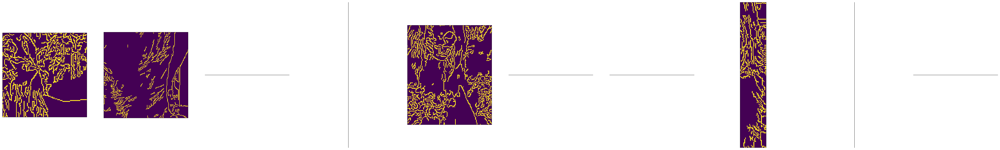

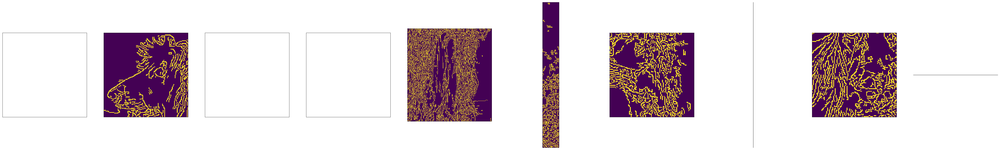

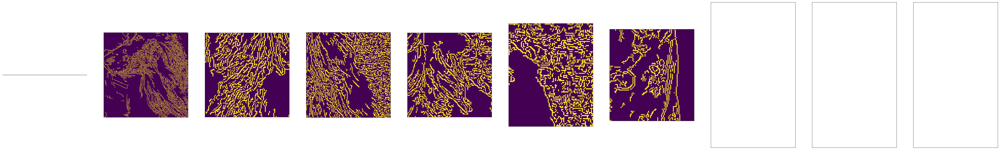

Temps d execution apres subplot : 28.2170000076 secondes ---
--------------------------------- start test cluster 200 ---------------------------------


In [2]:
#del model 

working_space = 'C:/Users/naru_/OneDrive/Documents/openclassroom/P7 traitement image/'
model = generateModelV2(
        working_directory=working_space,
        number_feature=75,
        number_directory=10,#0, #all
        number_images=100,#100,
        descriptor_generator="ORB",
        minimum_size_descriptor=100
    )

start = 500
stop = 100
step = -100

for nb_test in range(start, stop, step):
    print("-----------------------------------------------------------------------------------------")
    print("--------------------------------- start test cluster %s ---------------------------------" % str(nb_test))
    generateCluster(
        model,
        number_cluster=nb_test
    )
    showClusterPicture(
        model,
        mode_affichage="subplot",
        number_cluster_to_show=None
    )
    print("--------------------------------- start test cluster %s ---------------------------------" % str(nb_test))

Version : 0.3
Data directory : Data/
Max Number of directory : 10
Max Number of picture by directory : 100
Generator : ORB
Number of feature : 75
Minimum feature size  100
Computing Features for  n02085620-Chihuahua
Computing Features for  n02085782-Japanese_spaniel
Computing Features for  n02085936-Maltese_dog
Computing Features for  n02086079-Pekinese
Computing Features for  n02086240-Shih-Tzu
Computing Features for  n02086646-Blenheim_spaniel
Computing Features for  n02086910-papillon
Computing Features for  n02087046-toy_terrier
Computing Features for  n02087394-Rhodesian_ridgeback
Computing Features for  n02088094-Afghan_hound
Temps d execution apres parcour image + génération de features : 12.3090000153 secondes ---
-----------------------------------------------------------------------------------------
--------------------------------- start test cluster 500 ---------------------------------
Generation des clusters pour 70282 descripteurs
Temps d execution apres Clustering : 69

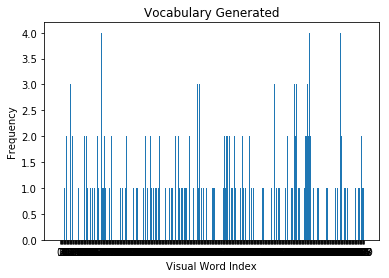

Temps d execution après plot BOV : 697.928999901 secondes ---
Temps d execution cluster : 697.928999901 secondes ---
affichage subplot des images liées au cluster 250
-------
144
80
-------


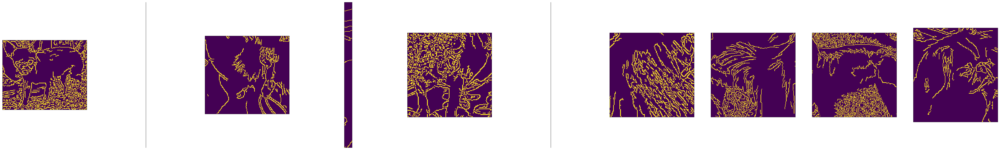

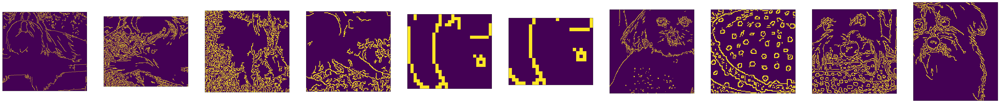

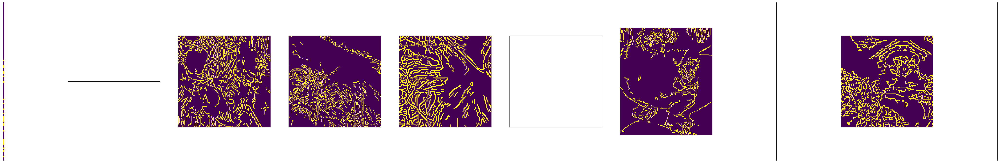

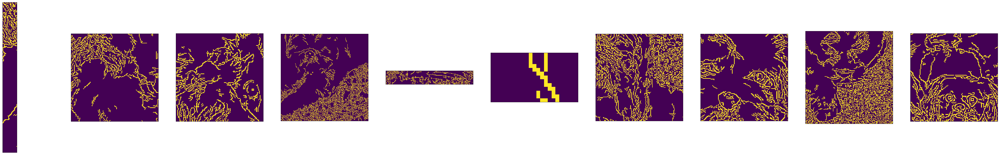

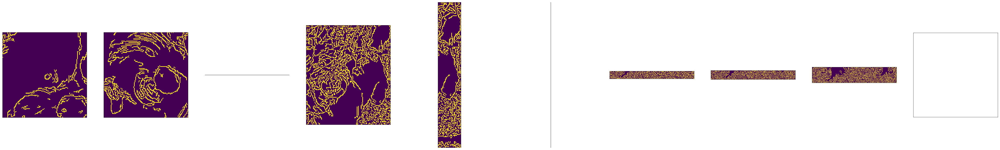

...

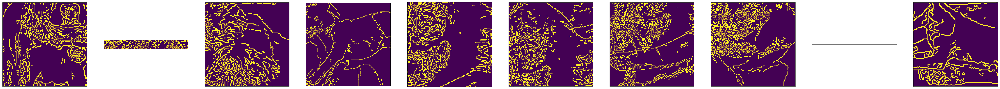

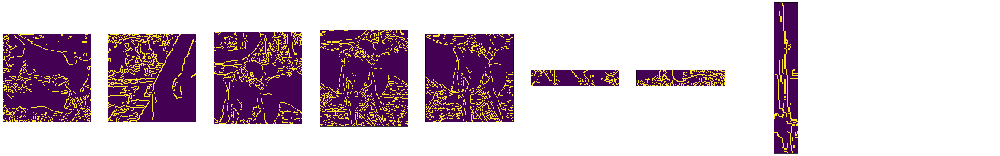

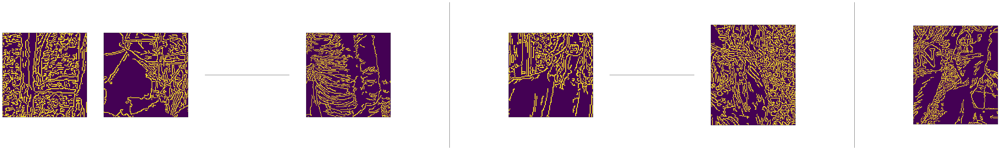

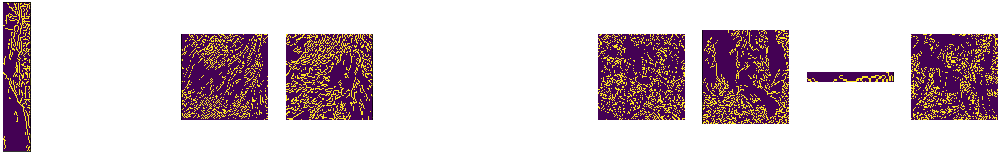

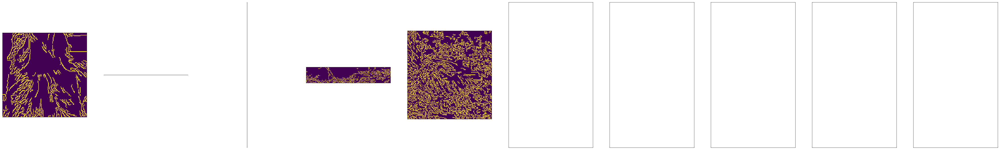

Temps d execution apres subplot : 10.3540000916 secondes ---
--------------------------------- start test cluster 500 ---------------------------------
-----------------------------------------------------------------------------------------
--------------------------------- start test cluster 400 ---------------------------------
Generation des clusters pour 70282 descripteurs
Temps d execution apres Clustering : 583.102999926 secondes ---
Vocabulary Histogram Generated
Temps d execution apres BOV : 583.102999926 secondes ---
Plotting histogram


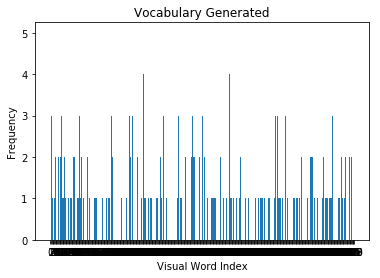

Temps d execution après plot BOV : 585.779000044 secondes ---
Temps d execution cluster : 585.779000044 secondes ---
affichage subplot des images liées au cluster 200
-------
240
80
-------


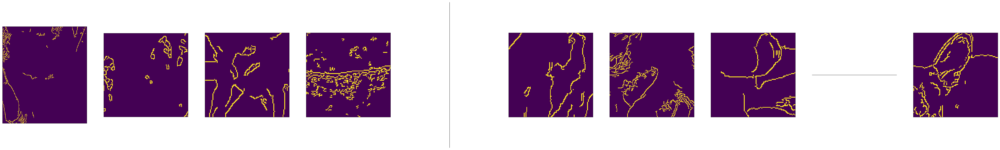

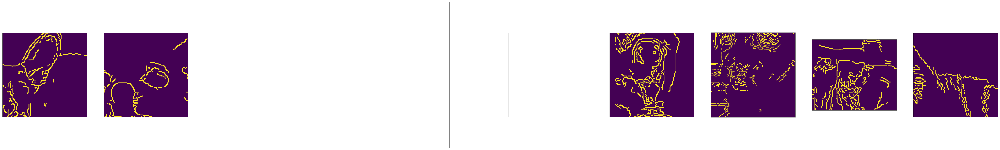

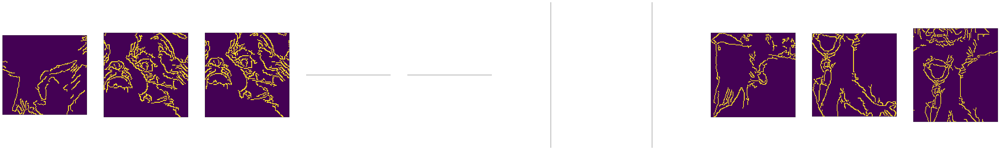

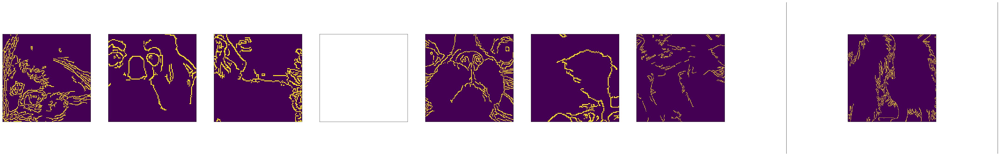

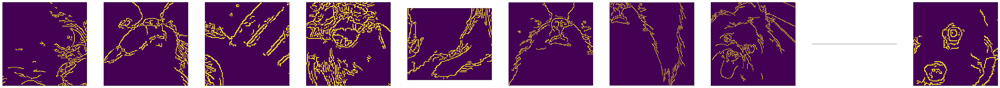

...

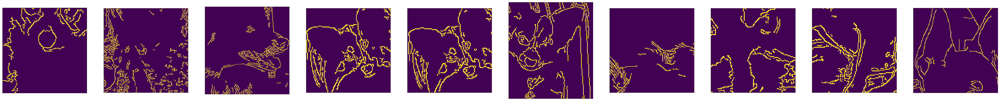

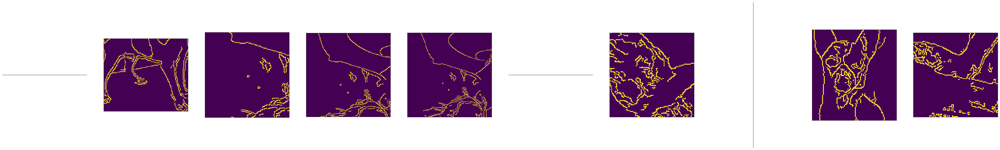

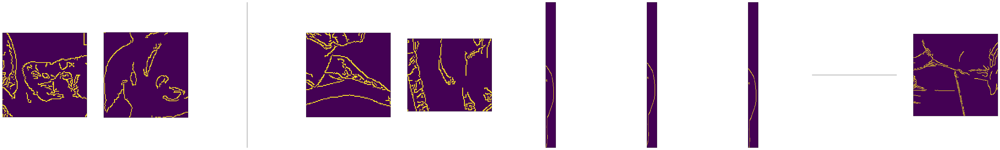

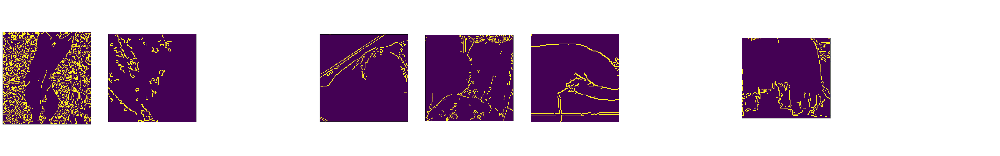

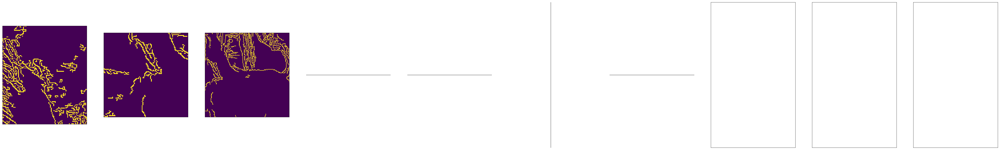

Temps d execution apres subplot : 16.9179999828 secondes ---
--------------------------------- start test cluster 400 ---------------------------------
-----------------------------------------------------------------------------------------
--------------------------------- start test cluster 300 ---------------------------------
Generation des clusters pour 70282 descripteurs
Temps d execution apres Clustering : 532.538000107 secondes ---
Vocabulary Histogram Generated
Temps d execution apres BOV : 532.538000107 secondes ---
Plotting histogram


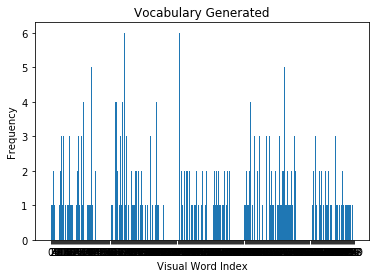

Temps d execution après plot BOV : 534.499000072 secondes ---
Temps d execution cluster : 534.499000072 secondes ---
affichage subplot des images liées au cluster 150
-------
348
80
-------


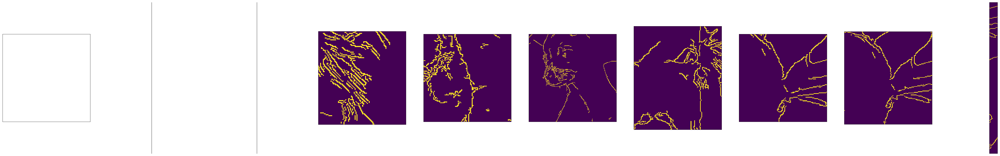

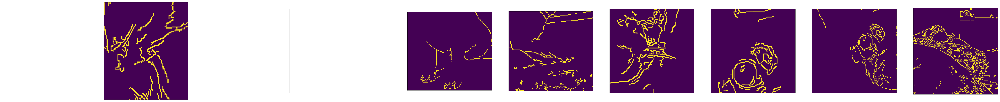

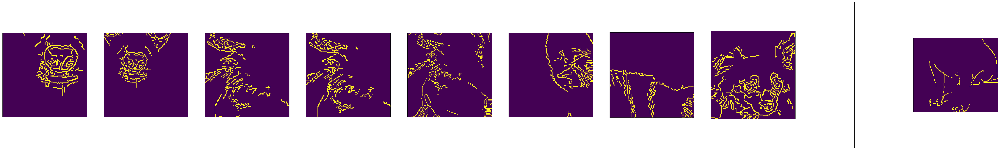

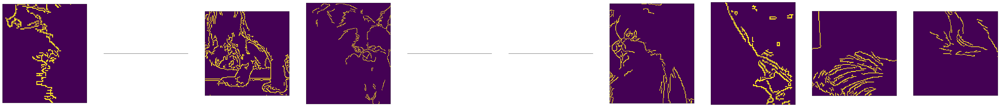

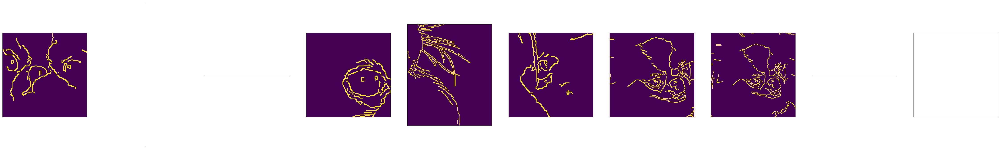

...

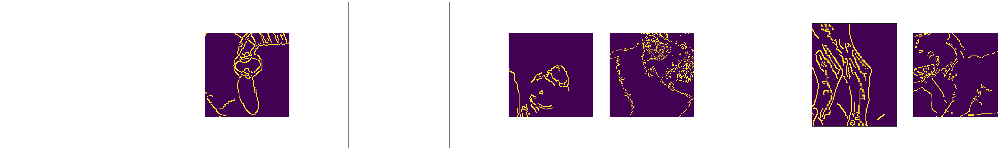

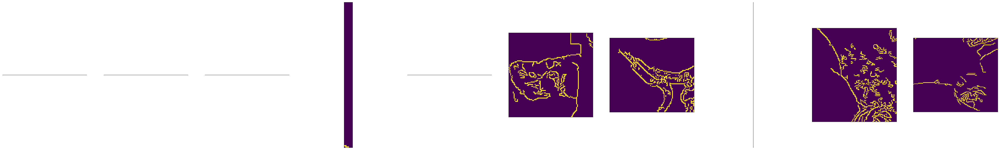

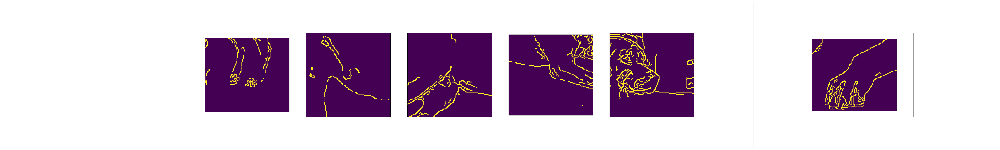

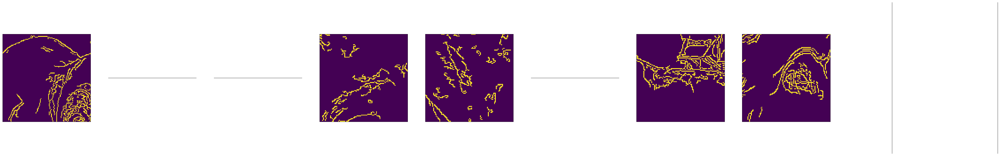

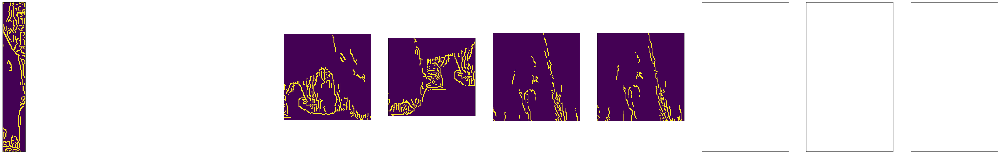

Temps d execution apres subplot : 24.4809999466 secondes ---
--------------------------------- start test cluster 300 ---------------------------------
-----------------------------------------------------------------------------------------
--------------------------------- start test cluster 200 ---------------------------------
Generation des clusters pour 70282 descripteurs
Temps d execution apres Clustering : 454.441999912 secondes ---
Vocabulary Histogram Generated
Temps d execution apres BOV : 454.441999912 secondes ---
Plotting histogram


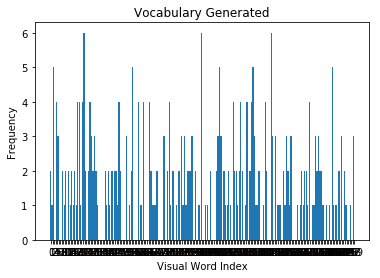

Temps d execution après plot BOV : 455.782000065 secondes ---
Temps d execution cluster : 455.782000065 secondes ---
affichage subplot des images liées au cluster 100
-------
396
80
-------


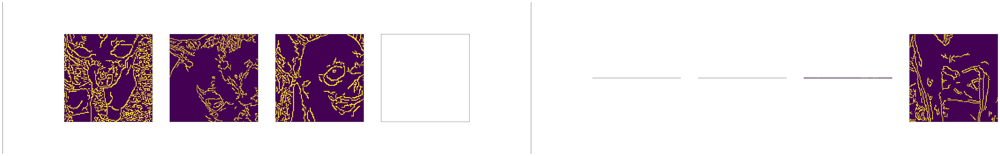

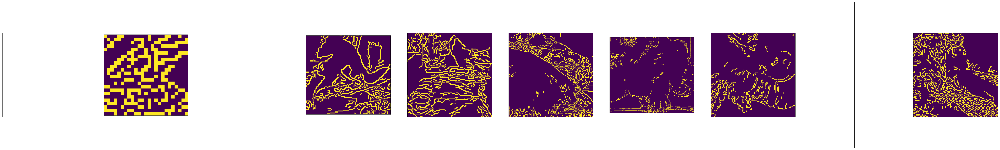

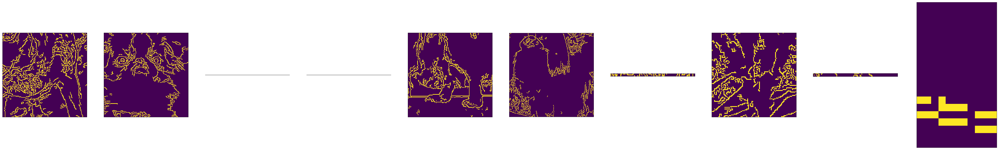

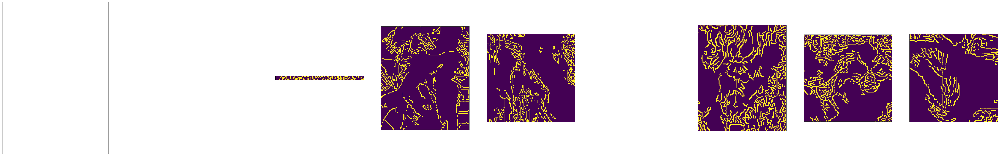

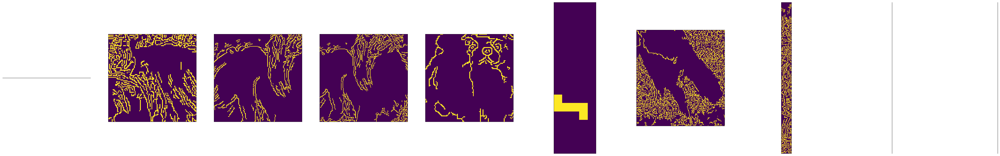

...

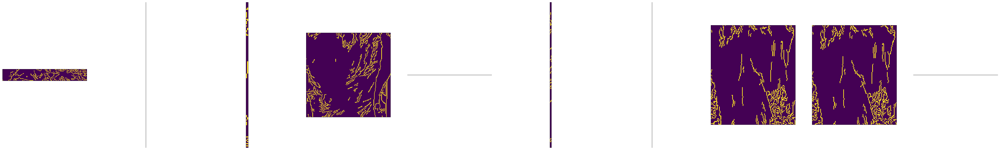

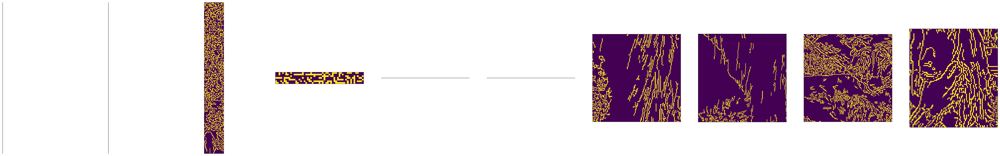

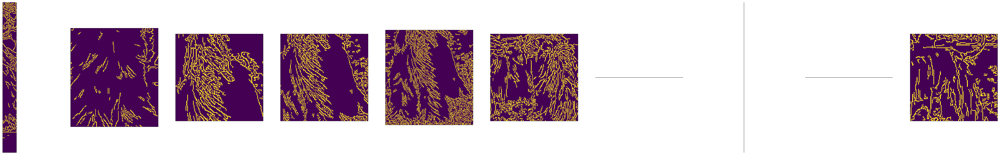

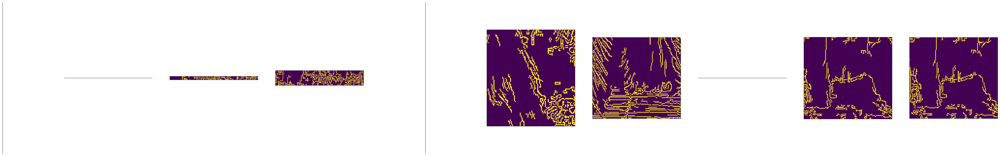

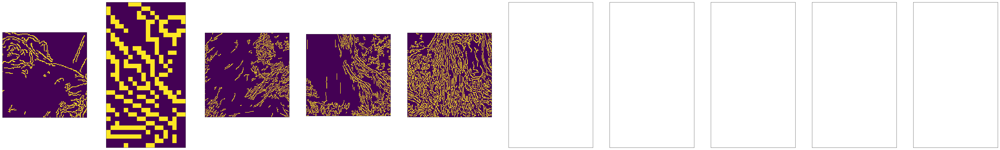

Temps d execution apres subplot : 27.518999815 secondes ---
--------------------------------- start test cluster 200 ---------------------------------


In [3]:
#del model 

working_space = 'C:/Users/naru_/OneDrive/Documents/openclassroom/P7 traitement image/'
model = generateModelV2(
        working_directory=working_space,
        number_feature=75,
        number_directory=10,#0, #all
        number_images=100,#100,
        descriptor_generator="ORB",
        minimum_size_descriptor=100
    )

start = 500
stop = 100
step = -100

for nb_test in range(start, stop, step):
    print("-----------------------------------------------------------------------------------------")
    print("--------------------------------- start test cluster %s ---------------------------------" % str(nb_test))
    generateCluster(
        model,
        number_cluster=nb_test
    )
    showClusterPicture(
        model,
        mode_affichage="subplot",
        number_cluster_to_show=None
    )
    print("--------------------------------- start test cluster %s ---------------------------------" % str(nb_test))

In [ ]:
#del model 

working_space = 'C:/Users/naru_/OneDrive/Documents/openclassroom/P7 traitement image/'
model = generateModelV2(
        working_directory=working_space,
        number_feature=75,
        number_directory=0, #all
        number_images=0,
        descriptor_generator="ORB",
        minimum_size_descriptor=100
    )

start = 500
stop = 100
step = -100

for nb_test in range(start, stop, step):
    print("-----------------------------------------------------------------------------------------")
    print("--------------------------------- start test cluster %s ---------------------------------" % str(nb_test))
    generateCluster(
        model,
        number_cluster=nb_test
    )
    showClusterPicture(
        model,
        mode_affichage="subplot",
        number_cluster_to_show=None
    )
    print("--------------------------------- start test cluster %s ---------------------------------" % str(nb_test))

Version : 0.3
Data directory : Data/
Max Number of directory : 0
Max Number of picture by directory : 0
Generator : ORB
Number of feature : 75
Minimum feature size  100
Computing Features for  n02085620-Chihuahua
Computing Features for  n02085782-Japanese_spaniel
Computing Features for  n02085936-Maltese_dog
Computing Features for  n02086079-Pekinese
Computing Features for  n02086240-Shih-Tzu
Computing Features for  n02086646-Blenheim_spaniel
Computing Features for  n02086910-papillon
Computing Features for  n02087046-toy_terrier
Computing Features for  n02087394-Rhodesian_ridgeback
Computing Features for  n02088094-Afghan_hound
Computing Features for  n02088238-basset
Computing Features for  n02088364-beagle
Computing Features for  n02088466-bloodhound
Computing Features for  n02088632-bluetick
Computing Features for  n02089078-black-and-tan_coonhound
Computing Features for  n02089867-Walker_hound
Computing Features for  n02089973-English_foxhound
Computing Features for  n02090379-red

In [ ]:
start = 1000
stop = 1000
step = -1000

for nb_test in range(start, stop, step):
    print("-----------------------------------------------------------------------------------------")
    print("--------------------------------- start test cluster %s ---------------------------------" % str(nb_test))
    generateCluster(
        model,
        number_cluster=nb_test
    )
    showClusterPicture(
        model,
        mode_affichage="subplot",
        number_cluster_to_show=None
    )
    print("--------------------------------- start test cluster %s ---------------------------------" % str(nb_test))